In [1]:
#Import Libraries
import pandas as pd
import numpy as np
import unicodedata
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import plotly.express as px
import branca

In [3]:
#Data extraction
df = pd.read_csv("//content/olist_geolocation_dataset.csv")
df

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


In [4]:
city_counts = df["geolocation_city"].value_counts()
print(city_counts)

sao paulo               135800
rio de janeiro           62151
belo horizonte           27805
são paulo                24918
curitiba                 16593
                         ...  
jacuípe                      1
mar vermelho                 1
quebrangulo                  1
poço das trincheiras         1
poxim                        1
Name: geolocation_city, Length: 8011, dtype: int64


In [5]:
# #Functions to clean the large amount of data.
def remove_accents(input_str):
    nfkd_form = unicodedata.normalize('NFKD', input_str)
    return u"".join([c for c in nfkd_form if not unicodedata.combining(c)])

def clean_city_column(df):
    df["geolocation_city"] = df["geolocation_city"].apply(remove_accents)
    city_counts = df["geolocation_city"].value_counts()
    most_common_city = city_counts.index[0]
    df["geolocation_city"] = df["geolocation_city"].apply(lambda x: most_common_city if x.lower() == most_common_city.lower() else x)
    return df

df = clean_city_column(df)

In [6]:
city_counts = df["geolocation_city"].value_counts()
print(city_counts)

sao paulo                160718
rio de janeiro            62151
belo horizonte            27805
curitiba                  16593
porto alegre              13521
                          ...  
olho dagua grande             1
paiquere                      1
poxim                         1
sao jose dos salgados         1
vera cruz de minas            1
Name: geolocation_city, Length: 5969, dtype: int64


In [7]:
 # Checking duplicates
df[df.duplicated()]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
15,1046,-23.546081,-46.644820,sao paulo,SP
44,1046,-23.546081,-46.644820,sao paulo,SP
65,1046,-23.546081,-46.644820,sao paulo,SP
66,1009,-23.546935,-46.636588,sao paulo,SP
67,1046,-23.546081,-46.644820,sao paulo,SP
...,...,...,...,...,...
1000153,99970,-28.343273,-51.873734,ciriaco,RS
1000154,99950,-28.070493,-52.011342,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS


In [8]:
# Remove duplicate rows
df = df.drop_duplicates()

In [9]:
#There are no nulls
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 720496 entries, 0 to 1000161
Data columns (total 5 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   geolocation_zip_code_prefix  720496 non-null  int64  
 1   geolocation_lat              720496 non-null  float64
 2   geolocation_lng              720496 non-null  float64
 3   geolocation_city             720496 non-null  object 
 4   geolocation_state            720496 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 33.0+ MB


In [10]:
top_100_cities = df["geolocation_city"].value_counts().head(50)
print(top_100_cities)

sao paulo                91794
rio de janeiro           35177
belo horizonte           19474
curitiba                 11263
porto alegre              8702
brasilia                  8228
salvador                  8083
guarulhos                 7411
sao bernardo do campo     5464
santo andre               5412
osasco                    4993
recife                    4428
fortaleza                 4326
goiania                   4247
campinas                  4182
sorocaba                  4124
nova iguacu               3633
contagem                  3519
juiz de fora              3496
ribeirao preto            3472
niteroi                   3459
campo grande              3452
florianopolis             3414
uberlandia                3271
sao jose dos campos       3062
belem                     3004
santos                    2989
sao goncalo               2982
barueri                   2793
sao jose do rio preto     2741
mogi das cruzes           2674
carapicuiba               2673
duque de

In [11]:
df["geolocation_city"] = df["geolocation_city"].str.title()

<ipython-input-11-fc0f16c62c46>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["geolocation_city"] = df["geolocation_city"].str.title()


In [12]:
df[["geolocation_lat", "geolocation_lng"]].head()

,geolocation_lat,geolocation_lng
0,-23.545621,-46.639292
1,-23.546081,-46.644820
2,-23.546129,-46.642951
3,-23.544392,-46.639499
4,-23.541578,-46.641607


In [13]:
df["geolocation_lat"] = df["geolocation_lat"].astype(float)
df["geolocation_lng"] = df["geolocation_lng"].astype(float)

<ipython-input-13-74db6e404a3a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["geolocation_lat"] = df["geolocation_lat"].astype(float)
<ipython-input-13-74db6e404a3a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["geolocation_lng"] = df["geolocation_lng"].astype(float)


In [14]:
df.head(20)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,Sao Paulo,SP
1,1046,-23.546081,-46.644820,Sao Paulo,SP
2,1046,-23.546129,-46.642951,Sao Paulo,SP
3,1041,-23.544392,-46.639499,Sao Paulo,SP
4,1035,-23.541578,-46.641607,Sao Paulo,SP
5,1012,-23.547762,-46.635361,Sao Paulo,SP
6,1047,-23.546273,-46.641225,Sao Paulo,SP
7,1013,-23.546923,-46.634264,Sao Paulo,SP
8,1029,-23.543769,-46.634278,Sao Paulo,SP
9,1011,-23.547640,-46.636032,Sao Paulo,SP


In [15]:
# Create a list of cities to be omitted
cities_to_exclude = ["Santo Antonio Do Canaa","Cruzeiro Do Sul","Ilha Dos Valadares", "Bom Retiro Da Esperanca", "Porto Trombetas", "Vila Dos Cabanos", "Ibiajara", "Castelo Dos Sonhos", "Sao Jose Da Mata", "Santa Lucia Do Piai", "Santana Do Sobrado", "Fernando De Noronha"]

# Create a map centered on Brazil
map = folium.Map(location=[-14.235004, -51.92528], zoom_start=4)

# Grouping markers into clusters
marker_cluster = MarkerCluster().add_to(map)

# Define a function for assigning colors to the bubbles
def get_color(count):
    if count < 50:
        return "green"
    elif count < 200:
        return "yellow"
    else:
        return "blue"

# Add a marker for each city in Brazil that is not in the list of cities to omit.
for city, group in df[(df["geolocation_state"].notnull()) & (~df["geolocation_city"].isin(cities_to_exclude))].groupby("geolocation_city"):
    lat = group["geolocation_lat"].mean()
    lng = group["geolocation_lng"].mean()
    count = len(group)
    color = get_color(count)
    folium.CircleMarker(location=[lat, lng], radius=5, color=color, fill=True, fill_color=color, popup=f"{city}: {count} records").add_to(map)

# Show the map
map

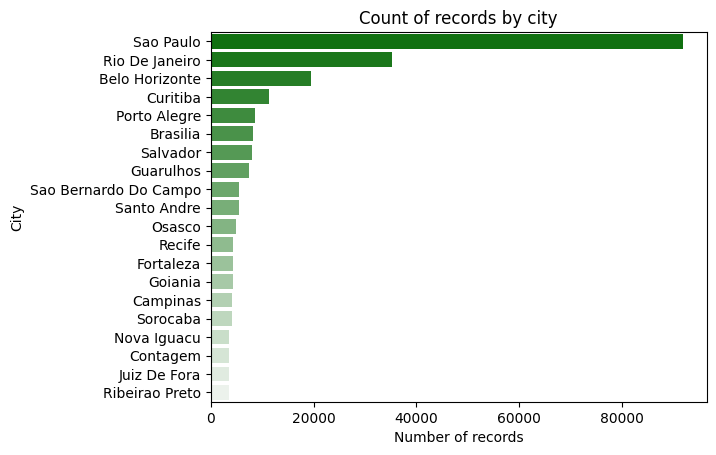

In [17]:
# Create a custom color palette with a gradient going from green to yellow to blue.
colors = ["green", "yellow", "blue"]
palette = sns.light_palette("green", n_colors=20,reverse=True) 

# Calculate the count of records per city
city_counts = df["geolocation_city"].value_counts().head(20)

# Create the horizontal bar chart
sns.barplot(x=city_counts.values, y=city_counts.index, palette=palette)

# Add tags and title
plt.xlabel("Number of records")
plt.ylabel("City")
plt.title("Count of records by city")

# Show the graph
plt.show()

In [18]:
# Calculate the count of records per city
city_counts = df["geolocation_city"].value_counts().head(20).reset_index()
city_counts.columns = ["City", "Number of records"]

# Sort the dataframe from largest to smallest according to the number of records
city_counts = city_counts.sort_values(by="Number of records", ascending=True)

# Create the interactive bar chart
fig = px.bar(city_counts, x="Number of records", y="City", orientation="h", color="Number of records", color_continuous_scale="Greens")

# Mostrar el gráfico
fig.show()

This analysis was performed with different libraries. The most time consuming part was the data cleaning since we had more than 1000000 records and we ended up with 720000. Now we can distinguish that some locations are not being recognized by the library and that is why we have hidden certain cities, for simple aesthetics. But in these cases what can be done is to manually search for these values and then normalize them. A dashboard has also been created in Power Bi of which I leave an image. Considering only the geographic data it has not been possible to do a deeper analysis.

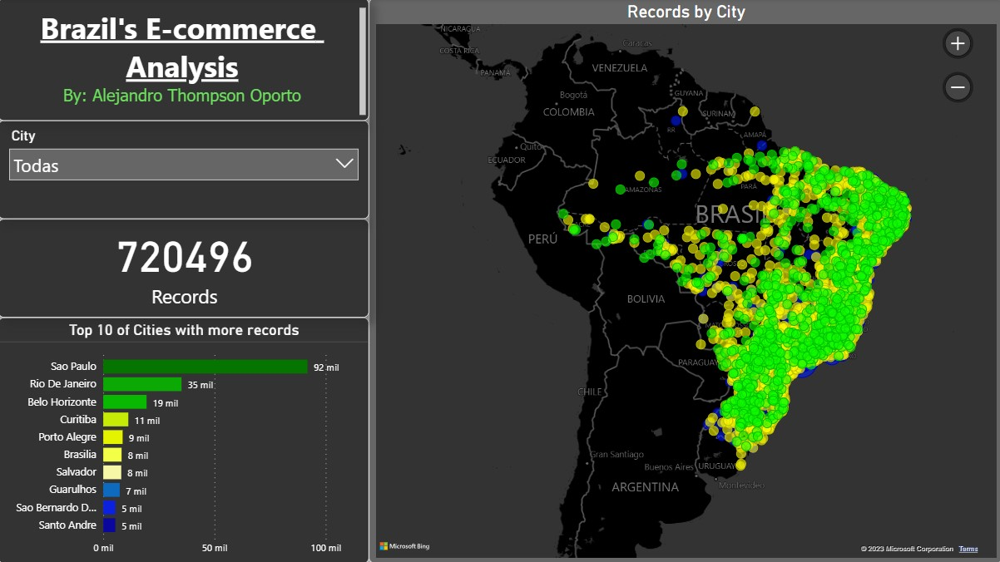

I hope you found this visual analysis useful. Soon I will be uploading more analysis, if you have any advice or comment feel free to tell me. 


My pleasure **Alejandro Thompson Oporto, Data Analyst.**